# HyperParameter Testing

### Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn
seaborn.set()
import wrds
import sys
sys.path.append('..')
import os
import imageio

# Import Main Python Modules
from src.dataframe_construction import *
from src.a_estimation import *
from src.optimal_strategies import *
from src.backtest import *


### Backtesting

#### Setting up the data

In [2]:
daily = False
datapath='../data/'

if daily:
    d = 3000
    start_date='2013-01-01'
    filename='CRSP_2013_2018_daily_cleaned.h5'
    caps_table='dlyprevcap'
    returns_table='dlyret'
else:
    d = 2000
    start_date='1965-01-01'
    filename='CRSP_monthly_cleaned.h5'
    caps_table='mthprevcap'
    returns_table='mthret'

df = Data(d=d, start_date=start_date, datapath=datapath, filename=filename, caps_table=caps_table, returns_table=returns_table)

#### HyperParameter Testing

In [3]:
def plot_given_N(Ns, vector, m, folder, name):
    # Filter Ns and vector based on the m parameter
    Ns_filtered = [n for n in Ns if n <= m]
    vector_filtered = vector[:len(Ns_filtered)]

    plt.figure(figsize=(10, 5))
    plt.plot(Ns_filtered, vector_filtered, marker='o', linestyle='-', linewidth=2)
    plt.xlabel('N')
    plt.ylabel('Average Return')
    plt.title('Average Return for Different Ns')

    plt.savefig(f'{folder}{name}.png', dpi=300)

In [4]:
def create_gif(folder_path, gif_name, file_prefix, file_numbers):
    images = []

    for file_number in file_numbers:
        file_path = f"{folder_path}{file_prefix}{file_number}.png"
        images.append(imageio.imread(file_path))
    duration = 10  # Set the duration in seconds
    gif_path = f"{folder_path}{gif_name}.gif"
    imageio.mimsave(gif_path, images, format='GIF', duration=duration)

/home/pedro/Downloads/mathematical_finance/2-notebooks/../src/a_estimation.py:25: RuntimeWarning: overflow encountered in exp
  return a * np.exp(-b * x) + c
/home/pedro/Downloads/mathematical_finance/2-notebooks/../src/a_estimation.py:25: RuntimeWarning: overflow encountered in multiply
  return a * np.exp(-b * x) + c
/home/pedro/Downloads/mathematical_finance/2-notebooks/../src/optimal_strategies.py:47: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10, 3.5))
/tmp/ipykernel_2122913/3965069206.py:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imagei

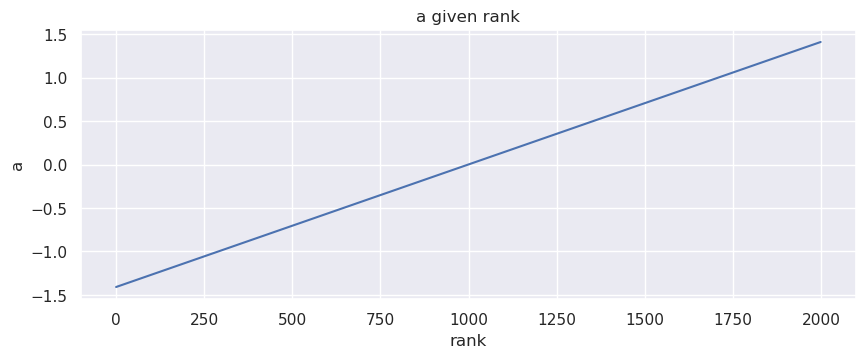

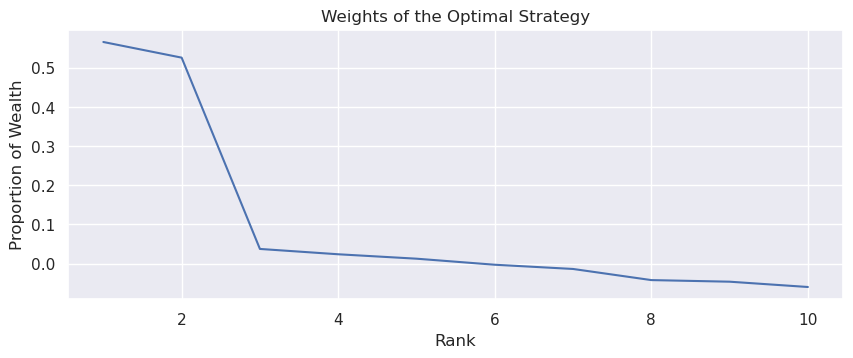

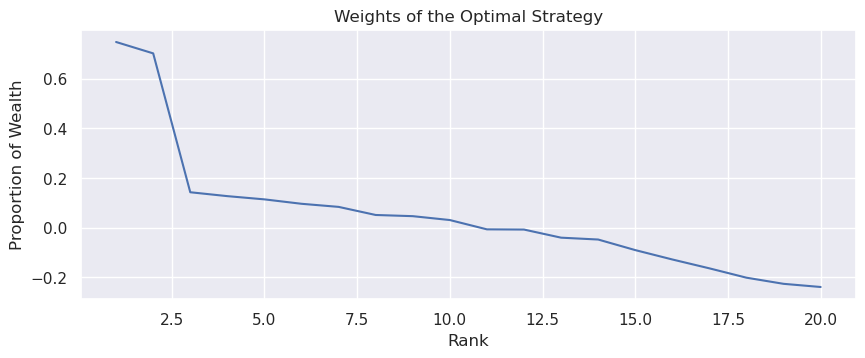

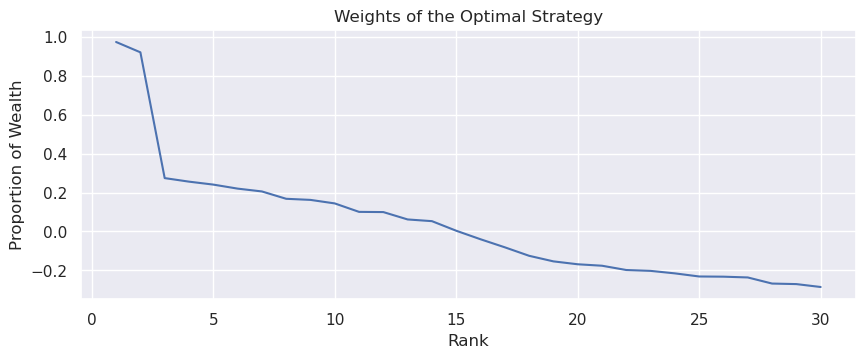

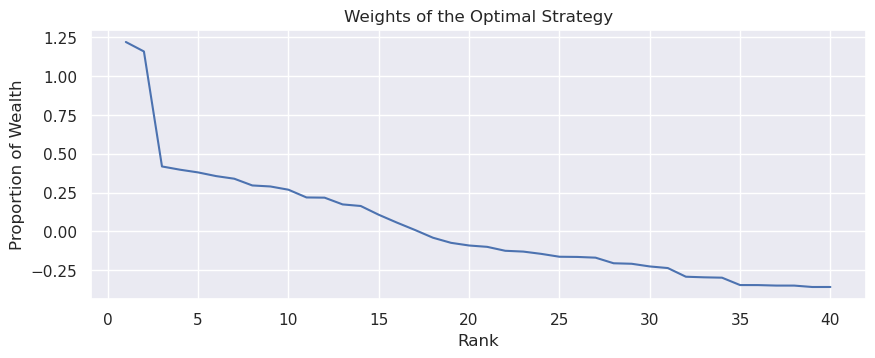

...

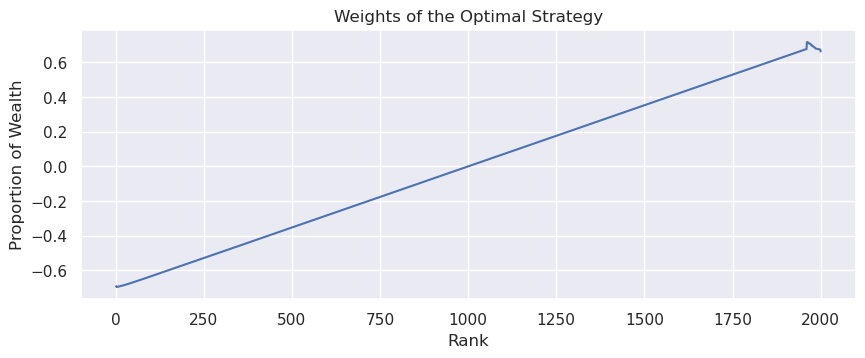

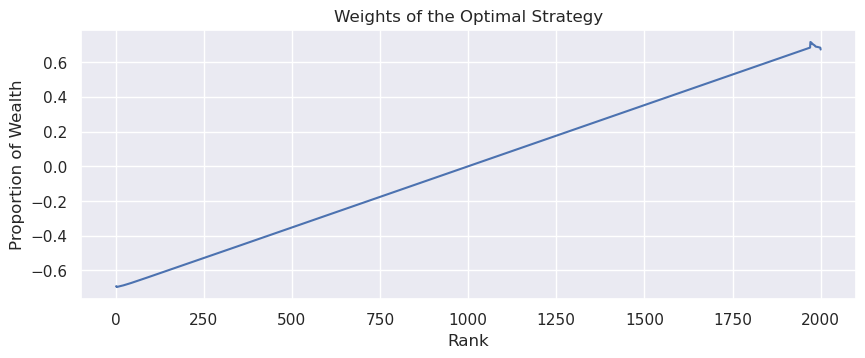

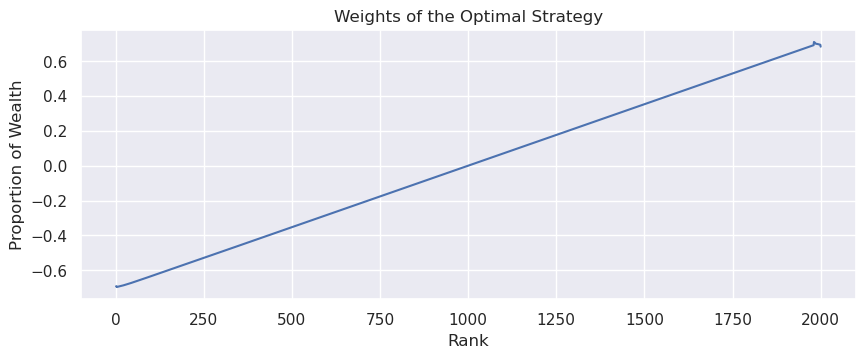

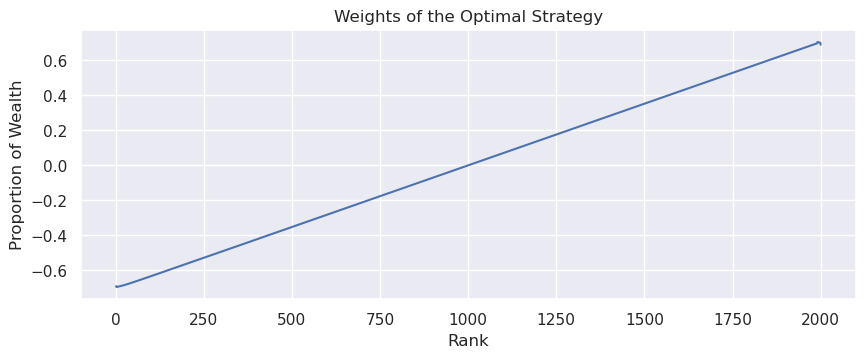

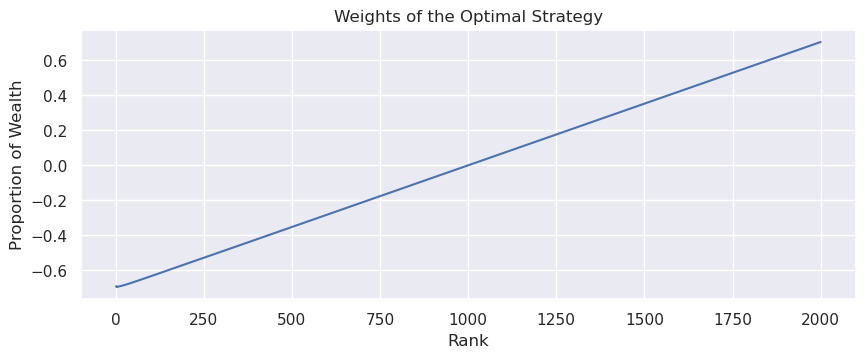

In [5]:
method = 'direct_log'
smooth_method = 'exponential_decay'
smooth_a = False
initial_folder_path = '../3-results/2-testing_convergence_strategies/'
plot_date = '2013-03-28'

settings = ['pure', 'mixed']
smooth_parameters_pure = [1]#, 2, 3, 5, 10, 15, 20, 30, 50]
smooth_parameters_mixed = smooth_parameters_pure
Ns = list(range(10, 2001, 10))  # N goes from 10 to 2000 in steps of 10
strategy_plots_N = Ns

for setting in settings:
    folder_path = initial_folder_path + setting + '/'
    if setting == 'pure':
        smooth_parameters = smooth_parameters_pure
    else:
        smooth_parameters = smooth_parameters_mixed

    for smooth_parameter in smooth_parameters:
        average_returns = []
        final_cumulative_returns = []
        
        new_folder = folder_path + 'exponential_decay/'
        os.makedirs(new_folder, exist_ok=True)

        a = estimate_a(df.weights_by_rank, smooth_method=smooth_method, smooth_parameter=smooth_parameter,  smooth_a=smooth_a)
        plot_a(a, data_path=new_folder + 'a_plot')

        strategy_plots_folder = new_folder + 'strategy_plots/'
        os.makedirs(strategy_plots_folder, exist_ok=True)  # Create the subdirectory for strategy plots

        for N in strategy_plots_N:
            strategy = compute_weights_optimal_open(setting=setting, N=N, a=a, weights_by_rank=df.weights_by_rank)
            plot_strategy(strategy=strategy, date=plot_date, data_path=strategy_plots_folder + 'strategy_plot_N='+str(N))

        # Create a GIF from strategy plot images
        create_gif(
            folder_path=new_folder,  # Set the folder path to the parent folder
            gif_name="strategy_evolution",
            file_prefix="strategy_plots/strategy_plot_N=",  # Keep the file_prefix including the subfolder
            file_numbers=strategy_plots_N
        )